### Theoretical methods of deep learning: Homework assignment 3
Submit solution by uploading to canvas, **by Friday, November 20th, 23:00**




**Task 1.** Consider the hierarchical broadcasting with the 3-state spin and the cyclic transition matrix 

$$P=\begin{pmatrix}
1-\epsilon & \epsilon & 0 \\
0 & 1-\epsilon & \epsilon \\
\epsilon & 0 & 1-\epsilon\end{pmatrix}.$$

1. Implement a simulation of broadcasing and the maximum likelihood reconstruction algorithm for this model.
2. Study numerically the performance of the ML reconstruction algorithm for flows with the branching number $b$=2 and error rates varying between 0 and 1. Do you observe a phase transition between solvable and non-solvable reconstruction phases? (Recall that in the non-solvable phase the probability of correct reconstruction by ML converges in the large depth limit to the probability of correct reconstruction by random guessing, while in the solvable phase these probabilities remain separated by some depth-independent gap.) If yes, what is the approximate critical value of $\epsilon$?


In [1]:
from __future__ import print_function 
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
%matplotlib inline

In [2]:
(1 + 2) % 3 - 1

-1

In [3]:
def makeRandFlips(spinA,  # input spins at a certain hierarchy level, as an array 
                  b,      # branching number
                  eps     # spin flip probability
                  ):
    shape1 = [b] + list(spinA.shape)
    spinA1 = np.empty(shape1, 'int')
    for a in range(b):
        flipA = np.random.rand(*list(spinA.shape)) < eps
        spinA1[a] = flipA * ((spinA + 2) % 3 - 1) + (1 - flipA) * spinA
        
    return spinA1    # spins at the next level

In [4]:
def runRandFlow(depth, 
                b,
                eps,
                root=1
               ): # run a full random hierarchical flow of spin flips
    spinA = np.array([root], 'int')
    spinAL = [spinA]

    for level in range(depth):
        spinAL.append(makeRandFlips(spinAL[-1], b, eps))
    return spinAL # the full flow as a list of arrays

In [5]:
def spinAL2tree(spinAL,
                plot=True,
                savefig=False
               ): # convert spin array list into a tree
    tree = nx.DiGraph()
    for level in range(len(spinAL)):
        for index, value in np.ndenumerate(spinAL[level]):
            node = tree.add_node(index)
            tree.nodes[index]['v'] = value
            if level > 0:
                predecessor = tuple(list(index)[1:])
                tree.add_edge(predecessor, index)
    
    # assign reasonable positions and colors for visualization
    pos = nx.spring_layout(tree)
    for level in range(len(spinAL)):  
        for index, value in np.ndenumerate(spinAL[level]):
            pos[index] = (np.sum([3.1**(l-level)*(index[l]-(spinAL[level].shape[l]-1.)/2)/(spinAL[level].shape[l]-1.+1e-8) 
                                  for l in range(level+1)]),
                         -level)  
    if plot:
        nx.draw(tree, pos, node_color=['r' if tree.nodes[node]['v'] == -1 else 'g' if tree.nodes[node]['v'] == 0 else 'b' for node in tree.nodes], node_size=100)
        if savefig:
            plt.savefig('tree.pdf')
    return tree

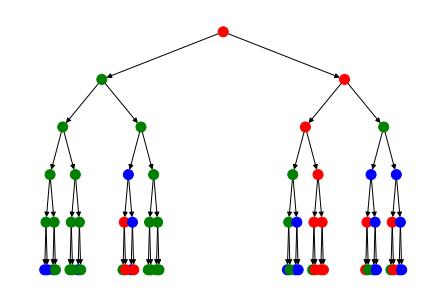

In [6]:
spinAL = runRandFlow(depth=5, 
                     b=2,
                     eps=0.3,
                     root=-1)

tree = spinAL2tree(spinAL)

In [7]:
def reconstruct(spinA, # final layer 
                method,
                eps=0.5, # needed for Max Likelihood reconstruction
               ):
    
    if method == 'random':
        root = np.random.randint(3) - 1
        return root
    elif method == 'ML':
        spinAneg = (spinA < 0).astype(int)
        spinAnull = (spinA == 0).astype(int)
        spinApos = (spinA > 0).astype(int)
        for layer in range(len(spinA.shape)-1):
           
            spinAneg, spinAnull, spinApos = ( (spinAneg*(1-eps)+spinAnull*eps).prod(axis=0), 
                                              (spinAnull*(1-eps)+spinApos*eps).prod(axis=0),
                                              (spinAneg*eps+spinApos*(1-eps)).prod(axis=0) )

            # normalize to avoid convergence to 0
            m = spinAneg + spinAnull + spinApos
            spinAneg, spinAnull, spinApos = spinAneg/m, spinAnull/m, spinApos/m

        root = np.argmax([spinAneg, spinAnull, spinApos]) - 1
        
    return root

True root: -1
random:  -1
ML:  -1


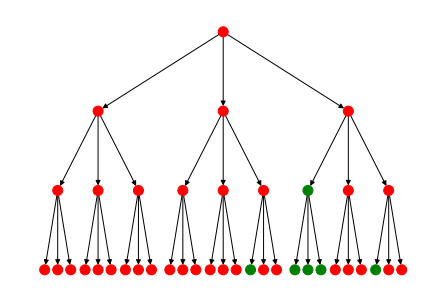

In [8]:
def testReconstruct():
    root = np.random.randint(3) - 1
    print ('True root:', root)
    
    depth = 3
    b = 3
    eps = 0.1

    spinAL = runRandFlow(depth=depth, 
                 b=b,
                 eps=eps,
                 root=root)

    tree = spinAL2tree(spinAL)

    methods = ['random', 'ML']
    for method in methods:
        root = reconstruct(spinAL[-1], method, eps)
        print (f'{method}: ', root)
        
testReconstruct()

In [9]:
def getShareCorrect(Nruns,
                   depth,
                   b,
                   eps,
                   methodL
                  ):
    Ncorrect = {}
    for method in methodL:
        Ncorrect[method] = 0 

    for _ in range(Nruns):
        root = 2*np.random.randint(2)-1
        spinAL = runRandFlow(depth=depth, 
                             b=b,
                             eps=eps,
                             root=root)
        for method in methodL:
            rootPred = reconstruct(spinAL[-1], method, eps)
            Ncorrect[method] += rootPred == root
    
    shareCorrect = dict([(method, float(Ncorrect[method])/Nruns) for method in methodL])
    
    return shareCorrect    

In [10]:
Nruns = 1000
depth = 15
b = 2
eps = 0.2
methodL = ['random', 'ML']

print (getShareCorrect(Nruns, depth, b, eps, methodL))

{'random': 0.326, 'ML': 0.72}


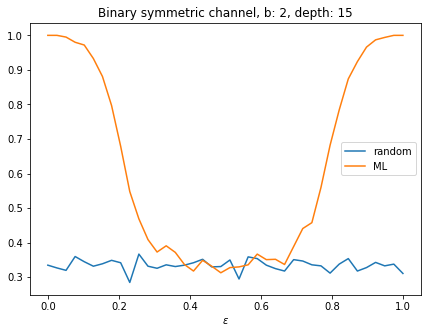

In [11]:
Nruns = 1000
depth = 15
b = 2
eps = 0.2
epsL = np.linspace(0, 1, 40)
shareCorrect = {}
for method in methodL:
    shareCorrect[method] = []
for eps in epsL:
    res = getShareCorrect(Nruns, depth, b, eps, methodL)
    for method in methodL:
        shareCorrect[method].append(res[method])

plt.figure(figsize=(7,5))
        
for method in methodL:
    plt.plot(epsL, shareCorrect[method], label=method)


plt.legend()
plt.xlabel('Success probability')
plt.xlabel('$\epsilon$')
plt.title('Binary symmetric channel, b: %d, depth: %d' %(b, depth))
plt.savefig('reconstruction_comparison.pdf')
plt.show()

#### The critical value of $\epsilon$ seems to be near $0.3$

#### Higher depth and more values of eps

0/40, took 120.55
1/40, took 122.90
2/40, took 124.72
3/40, took 123.94
4/40, took 123.62
5/40, took 123.66
6/40, took 123.71
7/40, took 123.68
8/40, took 123.96
9/40, took 123.77
10/40, took 123.46
11/40, took 123.54
12/40, took 124.02
13/40, took 124.12
14/40, took 124.01
15/40, took 123.92
16/40, took 123.51
17/40, took 123.12
18/40, took 123.41
19/40, took 123.89
20/40, took 123.48
21/40, took 123.95
22/40, took 123.63
23/40, took 123.88
24/40, took 123.78
25/40, took 123.99
26/40, took 124.12
27/40, took 123.83
28/40, took 123.86
29/40, took 123.44
30/40, took 123.42
31/40, took 123.26
32/40, took 123.26
33/40, took 123.49
34/40, took 123.43
35/40, took 123.68
36/40, took 123.04
37/40, took 123.70
38/40, took 123.02
39/40, took 121.68


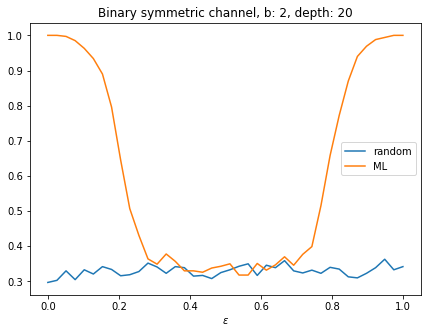

In [12]:
from time import time

Nruns = 1000
depth = 20
b = 2
eps = 0.2
epsL = np.linspace(0, 1, 40)
shareCorrect = {}
for method in methodL:
    shareCorrect[method] = []
for i, eps in enumerate(epsL):
    start = time()
    res = getShareCorrect(Nruns, depth, b, eps, methodL)
    stop = time()
    print(f'{i}/40, took {stop-start:.2f}')
    for method in methodL:
        shareCorrect[method].append(res[method])

plt.figure(figsize=(7,5))
        
for method in methodL:
    plt.plot(epsL, shareCorrect[method], label=method)


plt.legend()
plt.xlabel('Success probability')
plt.xlabel('$\epsilon$')
plt.title('Binary symmetric channel, b: %d, depth: %d' %(b, depth))
plt.savefig('reconstruction_comparison.pdf')
plt.show()

#### Yep, on this picture this is even more clear

**Task 2.** Consider the hierarchical flow with the standard binary symmetric channel. Let us say that the reconstruction of the root spin by a particular algorithm applied to a final configuration  $\sigma_n$ is *correct* if it agrees with  the optimal (ML) reconstruction. Suppose that the branching number is odd so that the local majority algorithm is well-defined. 
1. Prove that for any final spin configuration $\sigma_n$ the **local** majority reconstruction is correct if the error rate $\epsilon$ is small enough (i.e., the ML algorithm converges to the local majority algorithm as $\epsilon\to 0$). 
2. Give an example of a final spin configuration $\sigma_n$ for which the **global** majority reconstruction is wrong for all sufficiently small error rates $\epsilon$.

#### 2.1

* Let's consider the final layer of configurations and a single batch of "brother" spins and see, what would be the prediction (in the case of local majority rule) and the probability distribution (in the case of ML reconstruction) for their predecessor.

* Assume there are $l$ positive ($+1$) spins and $k$ negative ($-1$) spins among the brothers, and also $l > k$. Then the local majority prediction for the predecessor would be $+1$. As for the ML reconstruction, we need to write out the probabilities (up to the normalization factor).

* $P(1) = (1-\epsilon)^l \epsilon^k \approx \epsilon^k$ (if $\epsilon$ is small enough)
* $P(-1) = (1-\epsilon)^k \epsilon^l \approx \epsilon^l$
* $P(-1) = \epsilon^{l-k} P(1), \ l>k$
* We see that $P(1)$ completely suppresses $P(-1)$ on this step. So, for now, ML reconstruction agrees with local majority rule.
* As for the latter ML steps up the hierarchy, the gap between $P(-1)$ and $P(1)$ may become smaller (ML algorithm could "move away" from local majority rule). But for any fixed depth this can be alleviated by selecting an even smaller $\epsilon$. (A more rigorous argument for this is given on the picture below)
* So, the conclusion is that for any depth one can select  $\epsilon$ s.t. local majority rule is correct.

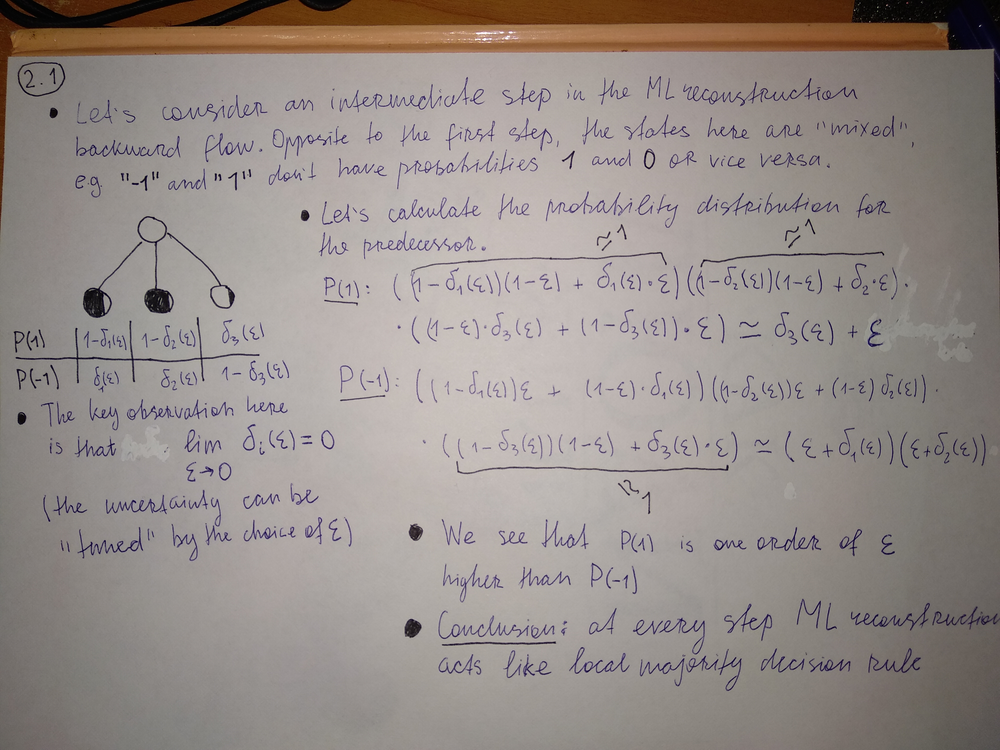

In [14]:
from IPython.display import Image

Image('problem21.jpg')

#### 2.2

* As was shown in the previous task, ML reconstruction is equivalent to local majority rule for sufficiently small $\epsilon$. So, it's suffices to show that for some configuration $\sigma_n$ local majority and global majority rules give different answers.

* For the sake of convenience, the rest of the prof is given on the picture below.

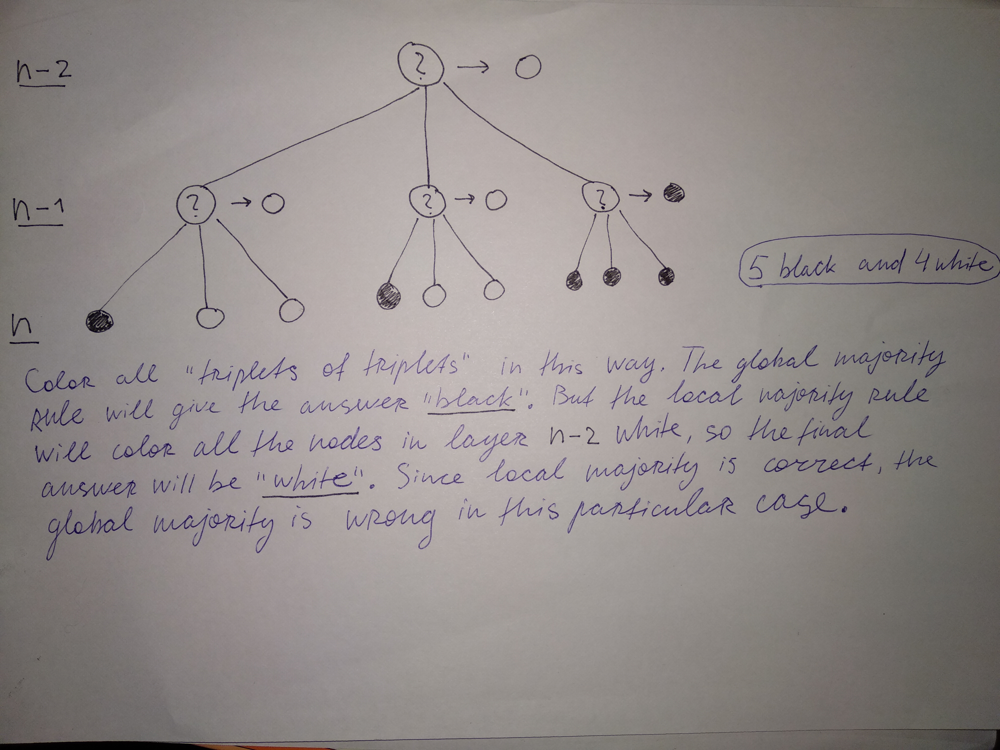

In [13]:
from IPython.display import Image

Image('problem22.jpg')